# What tree species should be planted in Manhattan?

## 📖 Task conditions
You work for a nonprofit organization advising the planning department on ways to improve the quantity and quality of trees in New York City. 

The urban design team believes **tree size** (using *trunk diameter* as a proxy for size) and **health** are the most desirable characteristics of city trees.

The city would like to learn more about **which tree species are the best choice to plant** on the streets of Manhattan.

## 💪 Questions that need to be answered
* What are the most common tree species in Manhattan?
* Which are the neighborhoods with the most trees?
* A visualization of Manhattan's neighborhoods and tree locations.
* What ten tree species would you recommend the city plant in the future?

## ✅ 1. Data verification and preparation
We are given two sets of data, but the key information is contained in the **trees** dataset. Let's take a look at it.

In [32]:
# import necessary modules 
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import contextily as cx

# import trees dataset
trees = pd.read_csv('data/trees.csv')
trees.head()

,tree_id,tree_dbh,curb_loc,spc_common,status,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,postcode,nta,nta_name,latitude,longitude
0,190422,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,40.770046,-73.984950
1,190426,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,40.770210,-73.985338
2,208649,9,OnCurb,American linden,Alive,Good,No,Yes,No,No,No,No,No,No,No,10019,MN15,Clinton,40.762724,-73.987297
3,193310,14,OnCurb,honeylocust,Alive,Good,No,No,Yes,No,No,Yes,No,No,Yes,10021,MN40,Upper East Side-Carnegie Hill,40.772171,-73.960456
4,199760,4,OnCurb,willow oak,Alive,Fair,No,No,No,No,No,No,No,No,No,10024,MN12,Upper West Side,40.782087,-73.980964


I made an initial analysis of the ***trees*** dataframe and came to the following conclusions:

1. Сolumn ***'tree_dbh'*** (the diameter of the tree in inches) contain errors and should be corrected.

2. There are **null values** in the columns ***'helth'*** and ***'spc_common'***.

3. Information about dead trees should be removed from the dataframe.

4. There are too many tree species. In order to conduct a competent analysis, we must reduce their number.



### 1.1. Preparing the 'tree_dbh' column

I found that the distribution of the ***'tree_dbh'*** column has a long right tail: 

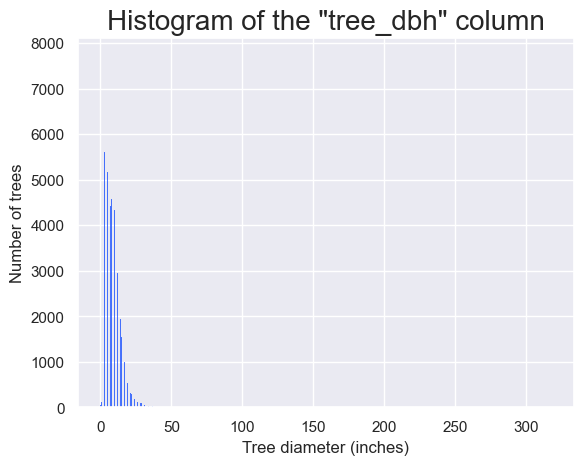

In [33]:
sns.set_theme(palette='bright')

# column 'tree_dbh' histogram
ax = sns.histplot(data=trees, x="tree_dbh")
ax.set(ylabel='Number of trees', xlabel = 'Tree diameter (inches)')
ax.set_title('Histogram of the "tree_dbh" column', fontsize = 20)
plt.show()

I think that **the diameter of the tree more than 30 inches and is an error**. Also, **the diameter less than or equal to 1 inch is an error**.

In [34]:
# find the percentage of error
trees_count = len(trees)

trees_error_dbh = trees[(trees['tree_dbh']<=1) | (trees['tree_dbh']>=31)]
trees_error_count = len(trees_error_dbh)

print(f"Total number of trees: {trees_count}")
print(f"Number of trees with strange 'tree_dbh' column: {trees_error_count}")
print(f"Percent of problem trees: {round(trees_error_count*100/trees_count,2)} %")

Total number of trees: 64229
Number of trees with strange 'tree_dbh' column: 481
Percent of problem trees: 0.75 %


The total problem data is less than one percent, but it can seriously affect the final result. To avoid this, the problem data ***must be deleted***.

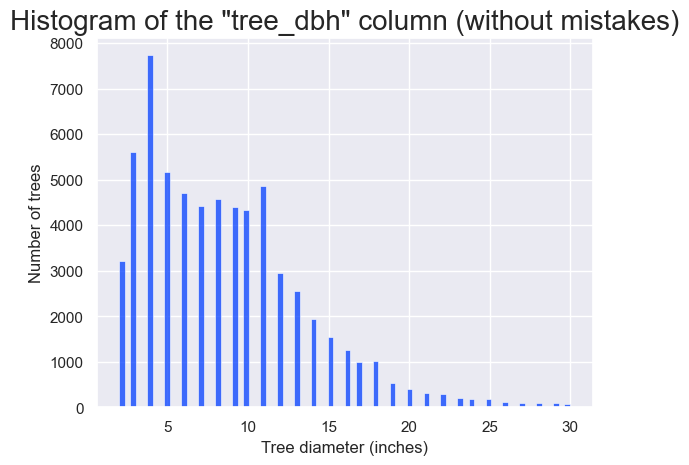

In [35]:
# delete error rows
trees = trees[(trees['tree_dbh']>1) & (trees['tree_dbh']<31)]

# column 'tree_dbh' histogram
ax = sns.histplot(data=trees, x="tree_dbh")
ax.set(ylabel='Number of trees', xlabel = 'Tree diameter (inches)')
ax.set_title('Histogram of the "tree_dbh" column (without mistakes)', fontsize = 20)
plt.show()

### 1.2. Dealing with null values

Columns ***'spc_common'*** and ***'health'*** have ***null*** values only when status of the tree is equal to Dead: 


In [36]:
# dataframe contains only rows with null values
na_trees = trees[trees['spc_common'].isna() | trees['health'].isna()]

print(f'\nAll rows with null values have the column status == {na_trees["status"].unique()}') 
print(f' \nNumber of trees with na values: {len(na_trees)}')

# ...all of dead trees have null values
dead_trees = trees[trees['status'] == 'Dead']

print(f' \nNumber of dead trees: {len(dead_trees)}')
print(f' \nDistinct values of spc_common column : {dead_trees["spc_common"].unique()}')
print(f' \nDistinct values of health column : {dead_trees["health"].unique()}')


All rows with null values have the column status == ['Dead']
 
Number of trees with na values: 1747
 
Number of dead trees: 1747
 
Distinct values of spc_common column : [nan 'honeylocust']
 
Distinct values of health column : [nan]


We don't need to delete data with empty values, it's enough to ***remove dead trees from the dataframe***.

### 1.3 Removing dead trees from the dataframe

We should remove dead trees from the dataframe because:
* We can't do any analysis based on the tree species for dead trees (there is no data)
* The diameter of a dead trees can influence our analysis 
* There is no information about the cause of death and death time
* Research questions are related to living trees

**Next we will work with live trees:**

In [37]:
# create dataframe with live trees
live_trees = trees[trees['status']!='Dead']
live_trees.head()

,tree_id,tree_dbh,curb_loc,spc_common,status,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,postcode,nta,nta_name,latitude,longitude
0,190422,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,40.770046,-73.984950
1,190426,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,40.770210,-73.985338
2,208649,9,OnCurb,American linden,Alive,Good,No,Yes,No,No,No,No,No,No,No,10019,MN15,Clinton,40.762724,-73.987297
3,193310,14,OnCurb,honeylocust,Alive,Good,No,No,Yes,No,No,Yes,No,No,Yes,10021,MN40,Upper East Side-Carnegie Hill,40.772171,-73.960456
4,199760,4,OnCurb,willow oak,Alive,Fair,No,No,No,No,No,No,No,No,No,10024,MN12,Upper West Side,40.782087,-73.980964


### 1.4 Grouping data by tree species

There are **too many tree species** in dataframe: 

In [38]:
print(f'Number of tree species: {len(live_trees["spc_common"].unique())}')

Number of tree species: 127


I noticed that the species column contains very detailed data that can be combined.

For example, let's find all oak trees:

In [39]:
oak_trees = live_trees[live_trees['spc_common'].str.contains('oak')]
print(oak_trees['spc_common'].unique())

['willow oak' 'pin oak' 'swamp white oak' 'northern red oak'
 'sawtooth oak' 'black oak' 'white oak' "Schumard's oak" 'shingle oak'
 'English oak' 'scarlet oak' 'bur oak' 'southern red oak']


In fact, these are ***species of the same plant*** that are slightly different for our research purposes.

I found a few more similar cases and wrote a conversion function:

In [40]:
# species consolidation function
def transform_category(cat):
    
    return_value = cat
    
    if 'oak' in cat:
        return_value = 'oak (consolidated)'
    
    elif 'elm' in cat:
        return_value = 'elm (consolidated)'
    
    elif 'maple' in cat:
        return_value = 'maple (consolidated)'
    
    elif 'pine' in cat:
        return_value = 'pine (consolidated)'
    
    elif 'linden' in cat: 
        return_value = 'linden (consolidated)'
    
    elif 'ash' in cat: 
        return_value = 'ash (consolidated)'
    
    elif ' cherry' in cat: 
        return_value = 'cherry (consolidated)'
    
    elif 'beam'in cat:
        return_value = 'hornbeam (consolidated)' 
    
    return return_value

In [41]:
# consolidation of the dataframe species column
live_trees['spc_common']=live_trees['spc_common'].apply(transform_category)
print(f'Number of tree species: {len(live_trees["spc_common"].value_counts())}')

Number of tree species: 87


The number of tree species has decreased, but this is not enough. Let's continue the analysis: let's find out the percentages of trees of each species:

In [42]:
# group by species

spc = live_trees['spc_common'].value_counts().reset_index()
spc.rename(columns={"index": "name", "spc_common": "count"}, inplace = True)

# find the percentage of each species 
sum_spc = spc['count'].sum()

spc['percent'] = spc['count']*100/sum_spc

print(f'Percent for 14 most numerous species is: {round(spc.head(14)["percent"].sum(),2)} %')

Percent for 14 most numerous species is: 94.27 %


After grouping, ***14 tree species account for 94% of all trees***

So, ***I decided to combine all other plant species into one group***

In [43]:
numerous_spc = spc.head(14)['name'].values

filter_name = live_trees['spc_common'].isin(numerous_spc)

# create group 'other' 
live_trees.loc[~filter_name,'spc_common'] = 'other' 


Now we have 15 species of trees and we can answer the questions.

## ✅ 2. What are the most common tree species in Manhattan?

I think a **more detailed analysis** is needed here.

The total number of trees will not give us complete information. 

In addition to the main question (What are the most common tree species in Manhattan?), let's find answers to the following questions:
* Which tree species have the largest trunk diameter?
* Which tree species have the best health?

It will help us to decide what tree species to recommend the city plant in the future.

In [44]:
# find the number of trees
trees_spc = live_trees['spc_common'].value_counts().reset_index()
trees_spc.rename(columns={"index": "name", "spc_common": "count"}, inplace = True)

# find percent of trees
sum_spc = trees_spc['count'].sum()
trees_spc['percent'] = trees_spc['count']*100/sum_spc

print("\nThe most common tree species in Manhattan\n")
print(trees_spc)
print(f'\nAverage by species: {trees_spc["count"].mean()}')


The most common tree species in Manhattan

                       name  count    percent
0               honeylocust  13167  21.236754
1        oak (consolidated)   8675  13.991710
2              Callery pear   7286  11.751423
3                    ginkgo   5849   9.433719
4     linden (consolidated)   5420   8.741794
5                   Sophora   4439   7.159562
6          London planetree   4034   6.506347
7          Japanese zelkova   3585   5.782165
8                     other   3551   5.727327
9        elm (consolidated)   2500   4.032193
10     maple (consolidated)    924   1.490299
11       ash (consolidated)    876   1.412880
12                   cherry    864   1.393526
13               crab apple    435   0.701602
14  hornbeam (consolidated)    396   0.638699

Average by species: 4133.4


Let's plot our results (blue line is the average):

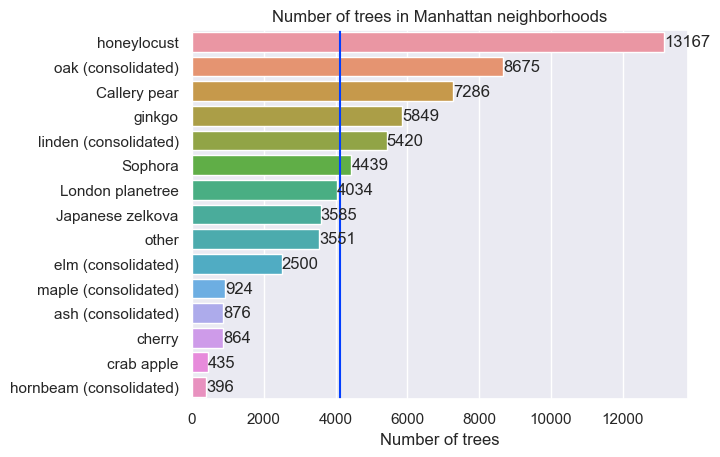

In [45]:
ax = sns.barplot(x='count', y='name', data = trees_spc, orient='h')
ax.set(title='Number of trees in Manhattan neighborhoods', xlabel='Number of trees', ylabel='')
ax.bar_label(ax.containers[0])
plt.axvline(x = trees_spc['count'].mean(), color = 'b', label = 'Total average value')
plt.show()

**Honeylocust** is the most common tree species in Manhattan. Manhattan also has a large number of different species of **oak trees, Callery pear, ginkgo** and **different species of linden trees**.

## ✅ 3. Which tree species in Manhattan have the largest diameter?

In [46]:
#find mean diameter
spc_dbh = live_trees.groupby('spc_common')['tree_dbh'].agg([np.mean,np.median]).reset_index()
spc_dbh.rename(columns={"mean": "mean_diameter", "median": "median_diameter"}, inplace = True)
#merge dataframes
spc_merged = trees_spc.merge(spc_dbh, left_on='name', right_on='spc_common')
spc_merged.drop('spc_common', axis=1, inplace=True)
spc_merged

,name,count,percent,mean_diameter,median_diameter
0,honeylocust,13167,21.236754,9.048530,9.0
1,oak (consolidated),8675,13.991710,8.329683,7.0
2,Callery pear,7286,11.751423,8.645210,8.0
3,ginkgo,5849,9.433719,8.446230,8.0
4,linden (consolidated),5420,8.741794,7.482841,7.0
5,Sophora,4439,7.159562,9.243523,9.0
6,London planetree,4034,6.506347,12.706247,13.0
7,Japanese zelkova,3585,5.782165,6.957880,6.0
8,other,3551,5.727327,5.800901,4.0
9,elm (consolidated),2500,4.032193,10.664800,9.0


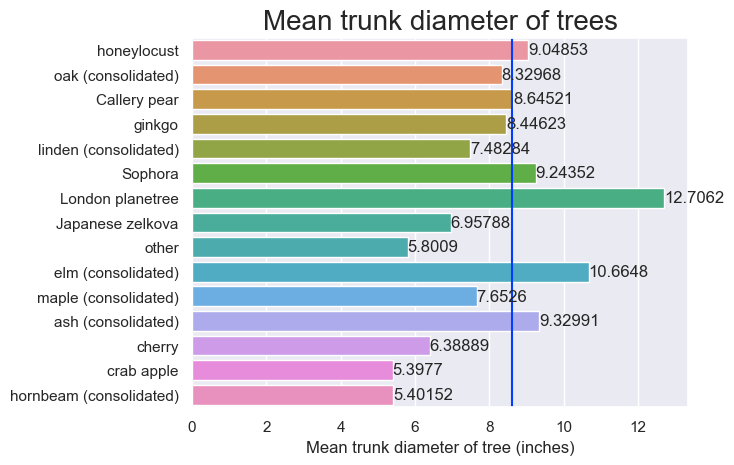

In [47]:
ax = sns.barplot(x='mean_diameter', y='name', data = spc_merged, orient='h')
ax.set(xlabel='Mean trunk diameter of tree (inches)', ylabel='')
ax.set_title('Mean trunk diameter of trees', fontsize = 20)
ax.bar_label(ax.containers[0])
plt.axvline(x = live_trees['tree_dbh'].mean(), color = 'b', label = 'Total average value (inches)')
plt.show()

The tree species on this bar plot are arranged in order of total count (like in the previous plot).

We can see that ***the most common trees do not have the largest mean trunk diameter***.

**Honeylocust, Sophora, elm (consolidated)** and **ash (consolidated)** trees have the large mean trunk diameter, but **London planetree** is the champion! 

## ✅ 4.Which tree species in Manhattan have the best health?

Let's see which trees are the healthiest. 

In [48]:
trbf = live_trees[['spc_common','health']]

trbf = pd.get_dummies(trbf, columns = ['health'])
trbf = trbf.groupby('spc_common').agg(np.sum).reset_index()
trbf = trbf[['spc_common','health_Good','health_Fair','health_Poor']]

trbf['sum'] = trbf['health_Good'] + trbf['health_Fair'] + trbf['health_Poor']
trbf

,spc_common,health_Good,health_Fair,health_Poor,sum
0,Callery pear,5374.0,1473.0,439.0,7286.0
1,Japanese zelkova,2762.0,619.0,204.0,3585.0
2,London planetree,2524.0,1129.0,381.0,4034.0
3,Sophora,3548.0,710.0,181.0,4439.0
4,ash (consolidated),653.0,171.0,52.0,876.0
5,cherry,673.0,138.0,53.0,864.0
6,crab apple,371.0,35.0,29.0,435.0
7,elm (consolidated),1969.0,407.0,124.0,2500.0
8,ginkgo,4378.0,980.0,491.0,5849.0
9,honeylocust,10951.0,2011.0,205.0,13167.0


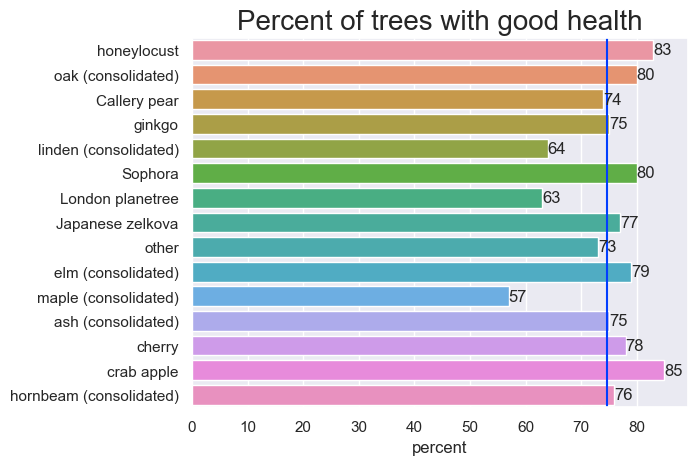

In [49]:
trbf['per_Good'] = round(trbf['health_Good']*100 / trbf['sum'])

ax = sns.barplot(x='per_Good', y='spc_common', data = trbf, orient='h', order = spc_merged['name'].values)
ax.set(xlabel='percent', ylabel='')
ax.set_title('Percent of trees with good health', fontsize = 20)
ax.bar_label(ax.containers[0])
plt.axvline(x = trbf['per_Good'].mean(), color = 'b')
plt.show()

The data is shown in order from the more frequently occurring tree to the less frequently occurring one. The champion is **Crab apple**, but **honeylocust, Sophora, oak (consolidated) and elm (consolidated)** also have good result.

Now we can use our results to select the best trees to plant.

## ✅ 5.What ten tree species would you recommend the city plant in the future?

As we know the urban design team believes tree size (using trunk diameter as a proxy for size) and health are the most desirable characteristics of city trees. Let's find the best trees for these indicators:

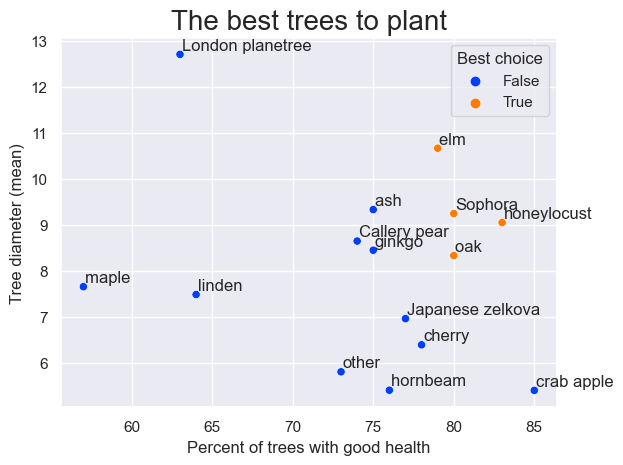

In [50]:
df_consolidated = trbf.merge(spc_merged, left_on='spc_common', right_on='name')
df_consolidated['Best choice'] = df_consolidated['spc_common'].isin(['elm (consolidated)', 'Sophora', 'honeylocust', 'oak (consolidated)'])
df_consolidated
ax = sns.scatterplot(data=df_consolidated, x='per_Good', y='mean_diameter', markers=True, hue='Best choice')
ax.set(xlabel='Percent of trees with good health', ylabel='Tree diameter (mean)')
ax.set_title('The best trees to plant', fontsize = 20)

for i in df_consolidated.values:
    plt.text(i[5]+0.1, i[9]+0.1, i[0].replace('(consolidated)',''))
    
plt.show()

In [51]:
# oak species 
new_live_trees = trees[trees['status']!='Dead']
filter_oak = new_live_trees['spc_common'].str.contains('oak')
print('\noak species')
print('\n',new_live_trees[filter_oak]['spc_common'].value_counts())

# elm species 
filter_elm = new_live_trees['spc_common'].str.contains('elm')
print('\nelm species')
print('\n',new_live_trees[filter_elm]['spc_common'].value_counts())


oak species

 pin oak             4538
northern red oak    1142
willow oak           882
swamp white oak      677
sawtooth oak         352
white oak            241
shingle oak          203
English oak          197
black oak            192
Schumard's oak       137
scarlet oak           71
bur oak               36
southern red oak       7
Name: spc_common, dtype: int64

elm species

 American elm    1565
Chinese elm      782
Siberian elm     153
Name: spc_common, dtype: int64


We can see at the plot, that best tree species to plant are: **Honeylocust**, **Sophora**, **oak** and **elm**.

I would recommend to plant the following varieties in Manhattan: **honeylocust**, **Sophora**, **pin oak**, **American elm**, **northern red oak**, **Chinese elm**, **willow oak**, **Chinese elm**, **swamp white oak** and **sawtooth oak**.

## ✅ 6.Wich are the neighbourhood with the most trees?

Let's prepare a dataframe containing information about the number of trees in each district.

In [52]:
# 1. keep only Manhattan neighborhoods:
neighborhoods = gpd.read_file('data/nta.shp')
man_neighbors = neighborhoods[neighborhoods['boroname']=='Manhattan']

# 2. get summary data for the trees in neighborhoods:
gr_nta = live_trees['nta_name'].value_counts().reset_index()
gr_nta.rename(columns={'nta_name': 'num_trees'}, inplace = True)

# 3. merge dataframes 
sum_neighbors = man_neighbors.merge(gr_nta, how='left', left_on='ntaname', right_on = 'index')
sum_neighbors.drop(['borocode', 'boroname', 'index'], axis=1, inplace=True)

# if there is no data for some neighbourhoods, they need to be deleted
sum_neighbors.dropna(inplace = True)

The neighbourhoods are different in area. It is necessary to determine what area falls on each tree.

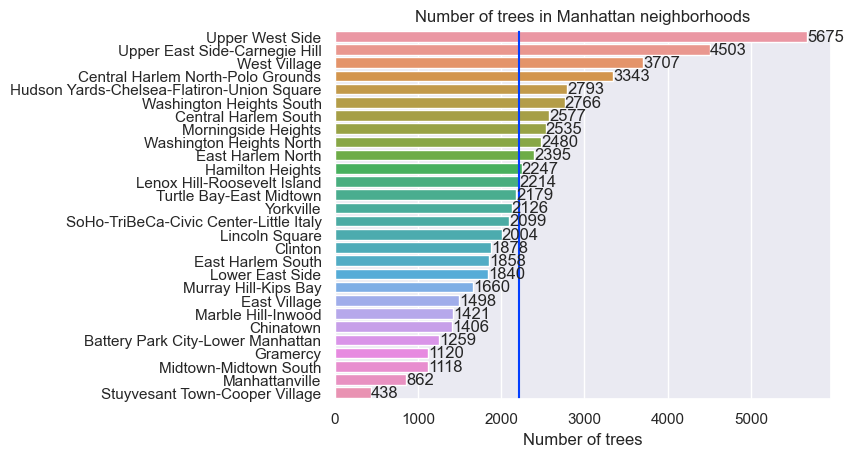

In [53]:
sum_neighbors.sort_values('num_trees', ascending=False, inplace = True)

sum_neighbors['shape_area_per_tree'] = round(sum_neighbors['shape_area'] / sum_neighbors['num_trees'])

ax = sns.barplot(x='num_trees', y='ntaname', data = sum_neighbors, orient='h')
ax.set(title='Number of trees in Manhattan neighborhoods', xlabel='Number of trees', ylabel='')
ax.bar_label(ax.containers[0])
plt.axvline(x = sum_neighbors['num_trees'].mean(), color = 'b', label = 'Total average value')
plt.show()

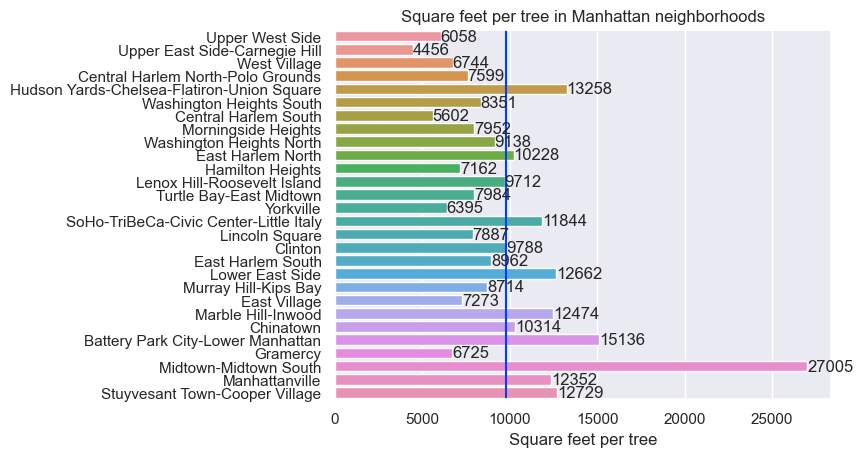

In [54]:
ax = sns.barplot(x='shape_area_per_tree', y='ntaname', data = sum_neighbors, orient='h')
ax.set(title='Square feet per tree in Manhattan neighborhoods', xlabel='Square feet per tree', ylabel='')
ax.bar_label(ax.containers[0])
plt.axvline(x = sum_neighbors['shape_area_per_tree'].mean(), color = 'b', label = 'Total average value')
plt.show()

Conclusion: **Upper West Side**, **Upper East Side-Carnegie Hill** and **West Village** are the neighborhoods with the largest number of trees.
But according to **the area per tree indicator** the winners are:  **Upper East Side-Carnegie Hill**, **Central Harlem South** and **Upper West Side** (and it has only third place!).

## ✅ 7. Visualization of Manhattan's neighborhoods

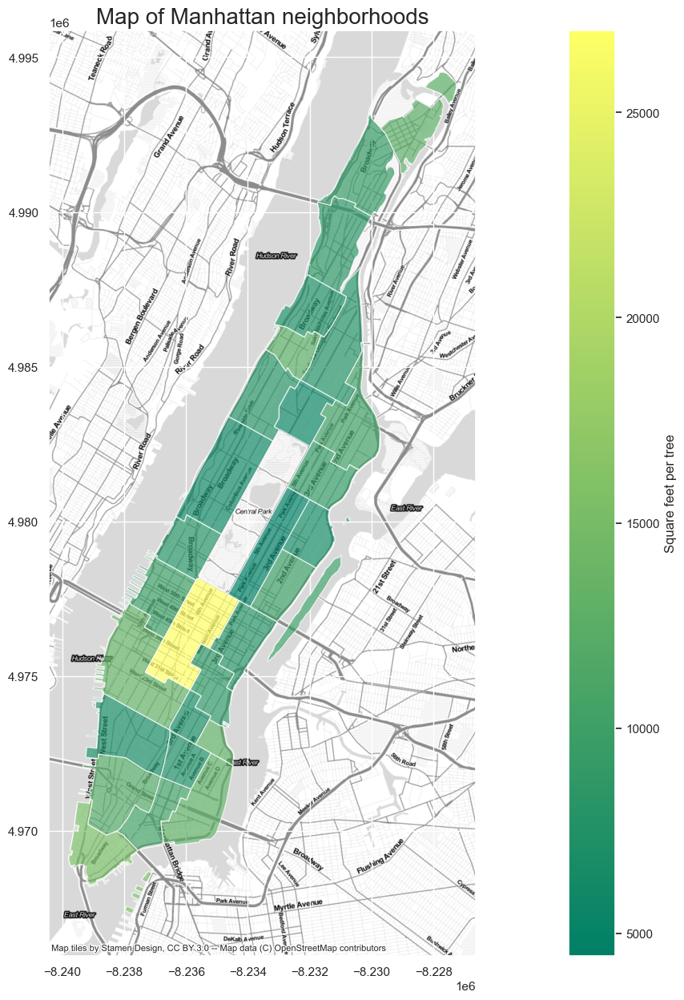

In [55]:
df = sum_neighbors.to_crs(epsg=3857)
ax = df.plot(column='shape_area_per_tree',figsize=(30, 15), legend=True, alpha=0.7,cmap='summer', legend_kwds={'label': "Square feet per tree"})
ax.set_title('Map of Manhattan neighborhoods', fontsize = 20)
cx.add_basemap(ax, crs=df.crs.to_string(), source=cx.providers.Stamen.TonerLite)
plt.show()

On this map greener neighborhoods have a large number of trees per unit of area.

## ✅ 8. Visualization of Manhattan trees

In [56]:
boroughs = gpd.read_file(gpd.datasets.get_path('nybb'))
boroughs.drop(boroughs[boroughs["BoroCode"]!=1].index, inplace = True)

df_wm = boroughs.to_crs(epsg=3857)

crs={'init':'epsg:4326'}
geo_df=gpd.GeoDataFrame(live_trees, crs=crs, geometry=gpd.points_from_xy(live_trees["longitude"], live_trees["latitude"]))
geo_df_wm = geo_df.to_crs(epsg=3857)

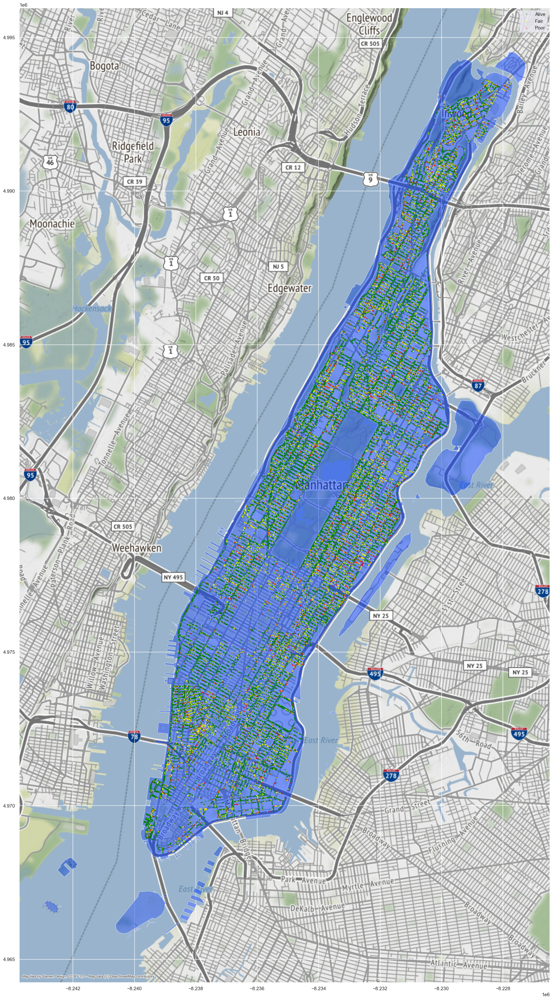

In [57]:
ax = df_wm.plot(figsize=(80, 40), alpha=0.5)
geo_df_wm[geo_df_wm['health']=="Good"].plot(ax=ax, markersize=2, alpha=0.5,color="green",  label="Alive")
geo_df_wm[geo_df_wm['health']=="Fair"].plot(ax=ax, markersize=2, alpha=0.5,color="yellow", label="Fair")
geo_df_wm[geo_df_wm['health']=="Poor"].plot(ax=ax, markersize=2, alpha=0.5,color="red",    label="Poor")
plt.legend()
cx.add_basemap(ax)

Green points are trees with good health, yellow points are trees with fair health and red points are trees with poor health.